In [1]:
import os 
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0" # "0,1,2,3" # "0"
import numpy as np
import h5py
import cv2
import os, sys
import argparse
from core.get_args import get_args
from core.produce_denoised_img import produce_denoised_img_no_crop
from core.utils import TedataLoader
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from core.watershed import *
from core.median_filter import apply_median_filter_cpu, apply_median_filter_gpu, apply_median_filter_gpu_simple
%load_ext autoreload
%autoreload 2

ImportError: cannot import name 'watershed_test' from 'core.watershed' (/mnt/ssd/hyun/fbi-net/FBI-Denoiser/denoise_and_get_CD/core/watershed.py)

In [3]:
data_path = f"./intermediate_result/denoised_img_F08_v2_img_dict.npy"
print(data_path.split("/")[2:])
img_dict = np.load(data_path,allow_pickle=True).item()


['denoised_img_F08_v2_img_dict.npy']


In [2]:
index = 4
F8_1 = img_dict['SET01']['F08'][index][0]
F8_1_uint8 = (F8_1*255).astype('uint8')
plt.imshow(F8_1_uint8)
plt.pause(0.01)
r = watershed_original(F8_1_uint8)
plt.imshow(r)

NameError: name 'img_dict' is not defined

112 295
28


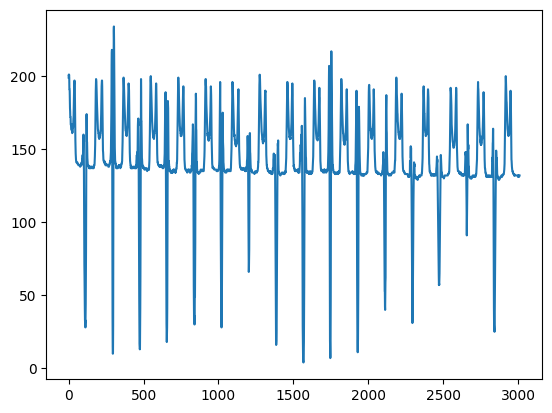

In [4]:
plt.plot(F8_1_uint8[100])
a,b = np.argmin(F8_1_uint8[100,:200]), 200+np.argmin(F8_1_uint8[100,200:400])
print(a,b)
print(F8_1_uint8[100,:200][a])

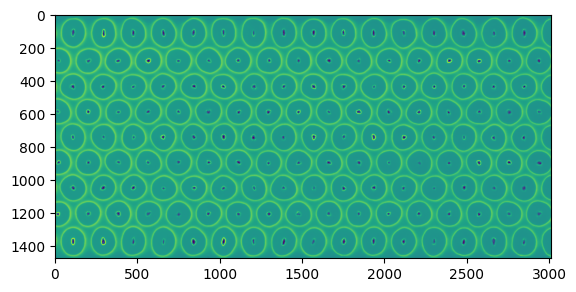

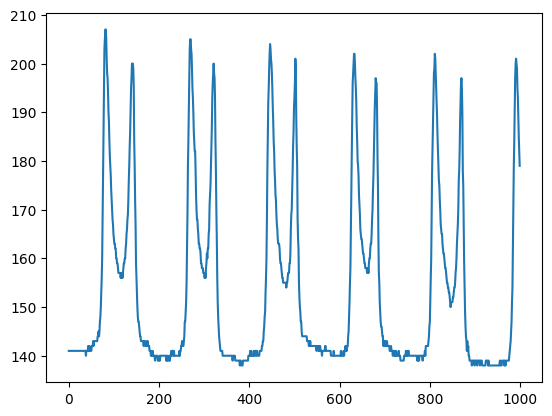

In [5]:
plt.imshow(F8_1_uint8)
plt.pause(0.01)
plt.plot(F8_1_uint8[235,:1000])

In [6]:

r = F8_1_uint8.copy()
threshold = 20
possible_section = []
for r_val in range(90,len(r)-50,5) :
    x_val, y_val = [], []
    cnt = 0
    x_val, y_val = [], []
    for idx,val in enumerate(r[r_val]):
        if val < 40:
            # print(idx,end=",")
            x_val.append(idx)
            y_val.append(r_val)
            cnt+=1
    # print("")
    if cnt  >threshold and (len(possible_section) ==0 or possible_section[-1] < r_val - 100):
        possible_section.append(r_val)

In [7]:

for r_val in range(100,len(r)-50,15) :
    print(r_val, end=',')
print("")
# print(possible_section)

100,115,130,145,160,175,190,205,220,235,250,265,280,295,310,325,340,355,370,385,400,415,430,445,460,475,490,505,520,535,550,565,580,595,610,625,640,655,670,685,700,715,730,745,760,775,790,805,820,835,850,865,880,895,910,925,940,955,970,985,1000,1015,1030,1045,1060,1075,1090,1105,1120,1135,1150,1165,1180,1195,1210,1225,1240,1255,1270,1285,1300,1315,1330,1345,1360,1375,1390,1405,1420,


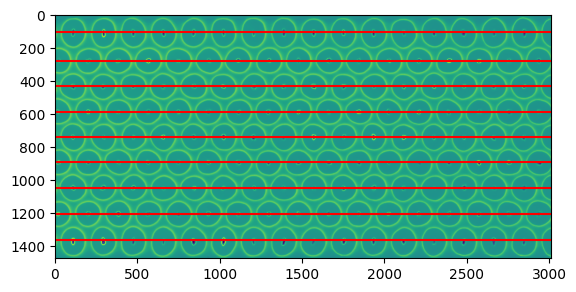

In [8]:

# plt.plot(x_val,y_val,marker='o',color='r',markersize=3)
plt.imshow(F8_1_uint8)
# plt.axhline(r_val)
for i in possible_section:
    plt.axhline(i,color='r')

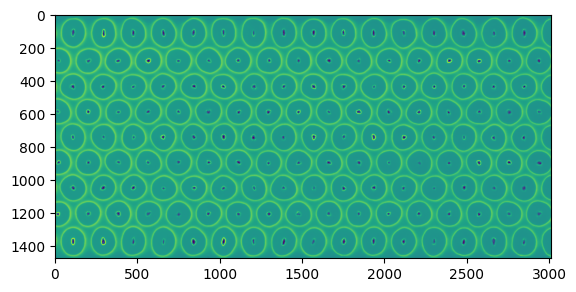

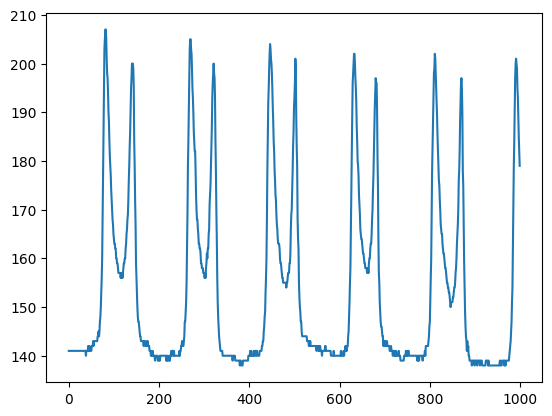

In [9]:
plt.imshow(F8_1_uint8)
plt.pause(0.01)
plt.plot(F8_1_uint8[235,:1000])

[90, 255, 410]


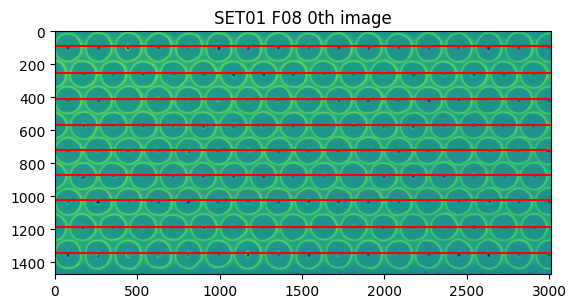

[95, 260, 420]


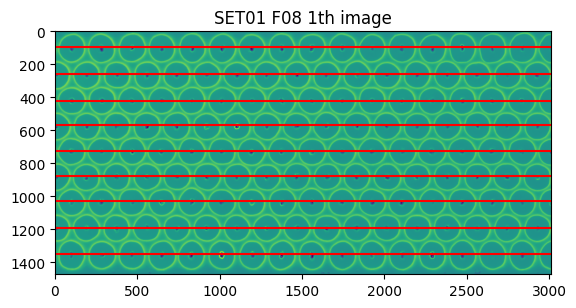

[90, 250, 405]


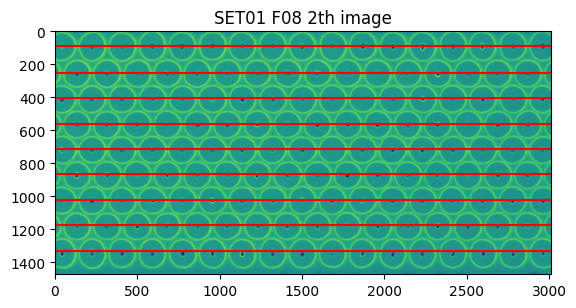

[90, 250, 405]


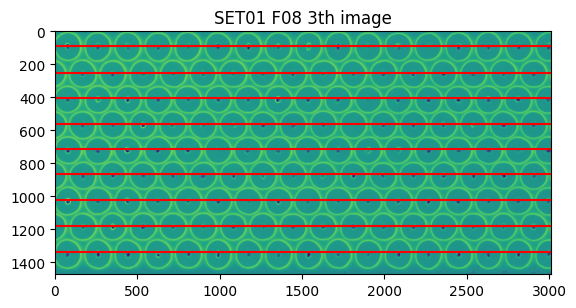

[95, 270, 430]


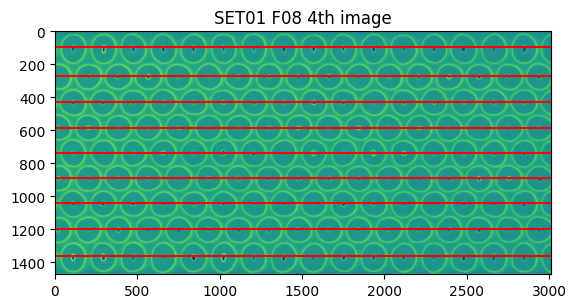

[90, 255, 415]


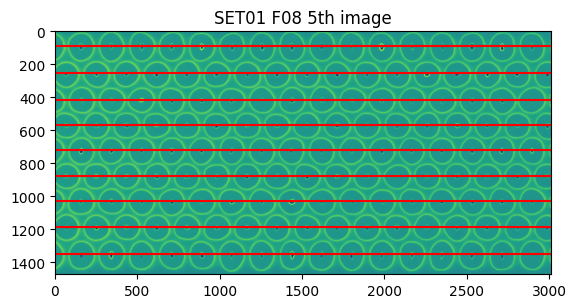

[90, 260, 420]


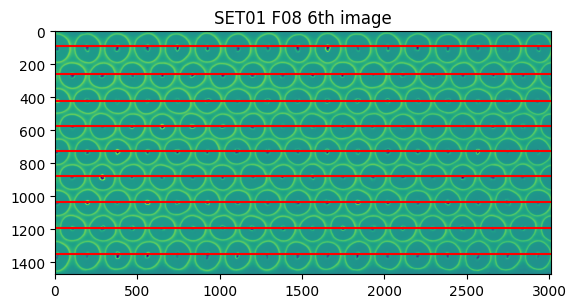

[90, 255, 410]


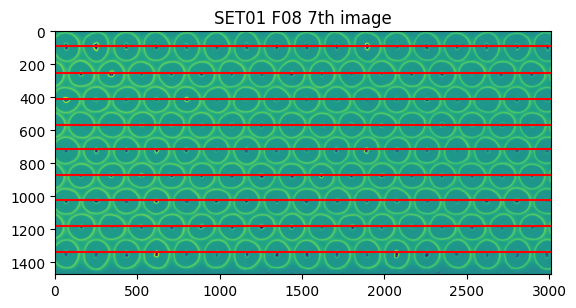

[90, 260, 410]


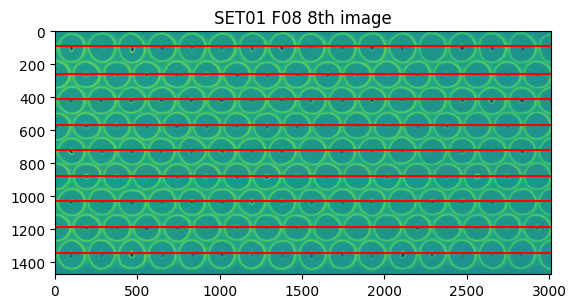

[90, 260, 415]


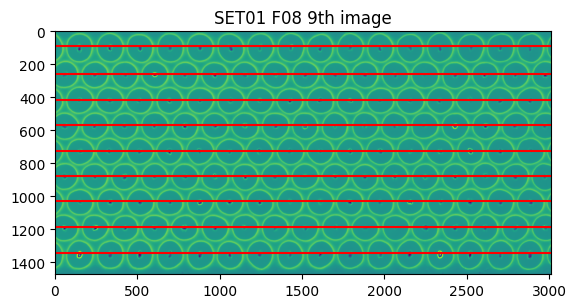

[90, 260, 415]


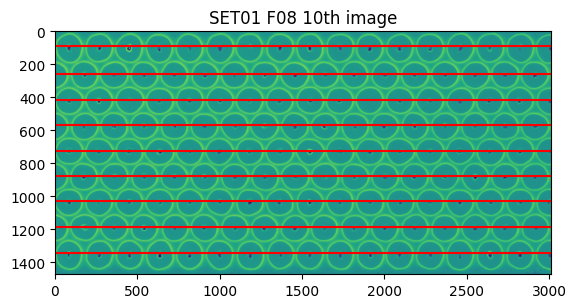

[90, 255, 410]


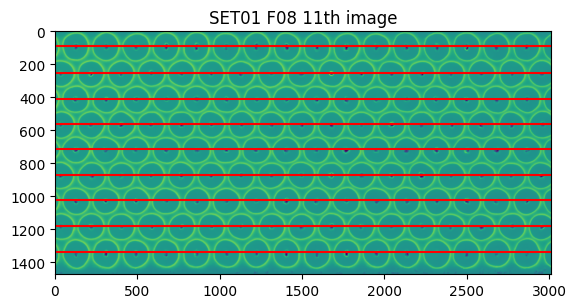

[90, 255, 405]


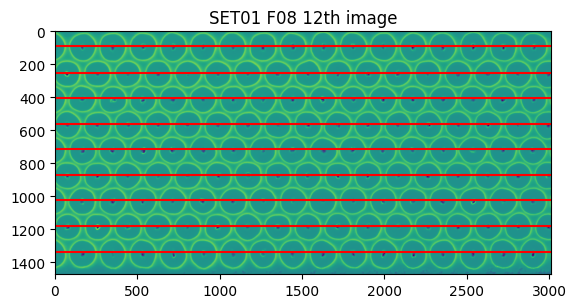

[90, 250, 405]


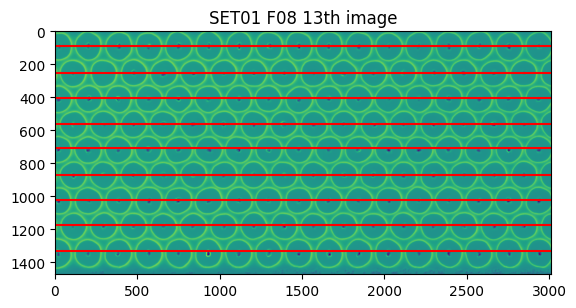

[90, 250, 405]


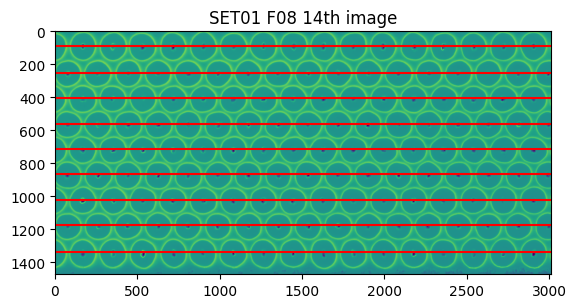

[90, 255, 410]


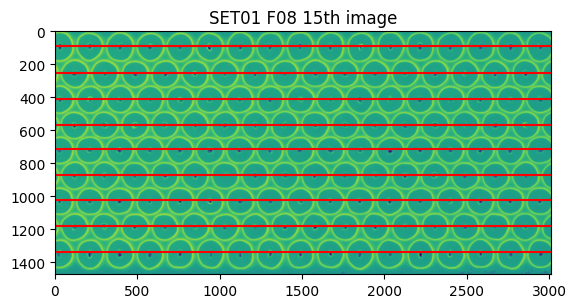

In [10]:

for index in range(16):
    F8_1 = img_dict['SET01']['F08'][index][0]
    F8_1_uint8 = (F8_1*255).astype('uint8')
    
    r = F8_1_uint8.copy()
    threshold = 20
    possible_section_row = []
    for r_val in range(90,len(r)-50,5) :
        x_val, y_val = [], []
        cnt = 0
        x_val, y_val = [], []
        for idx,val in enumerate(r[r_val]):
            if val < 80:
                # print(idx,end=",")
                x_val.append(idx)
                y_val.append(r_val)
                cnt+=1
        # print("")
        if cnt > threshold and (len(possible_section_row) ==0 or possible_section_row[-1] < r_val - 140):
            possible_section_row.append(r_val)
    print(possible_section_row[:3])
    plt.title(f"SET01 F08 {index}th image")
    plt.imshow(r)
    # plt.axhline(r_val)
    for i in possible_section_row:
        plt.axhline(i,color='r')
    plt.pause(0.01)

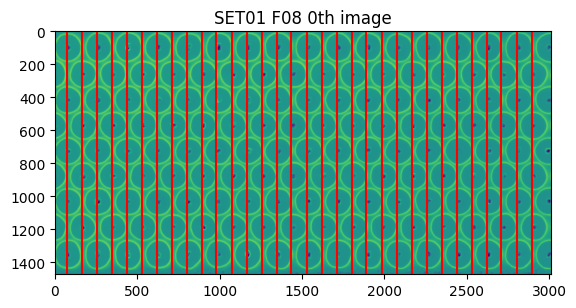

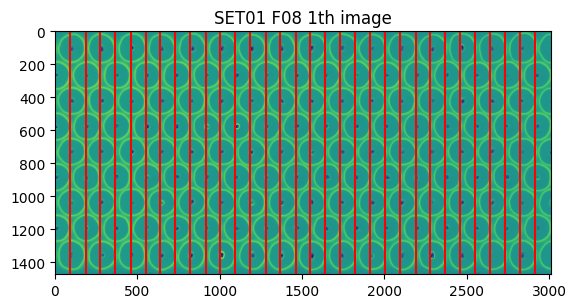

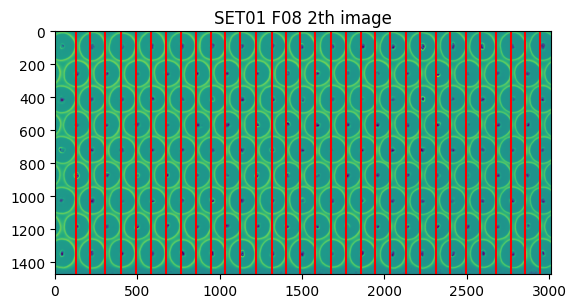

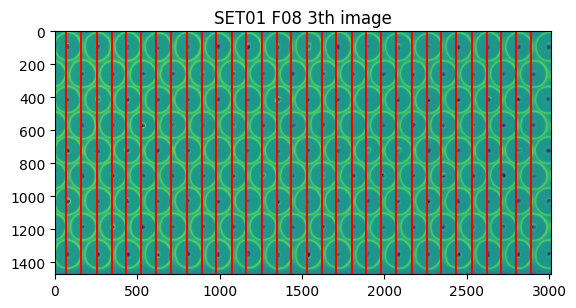

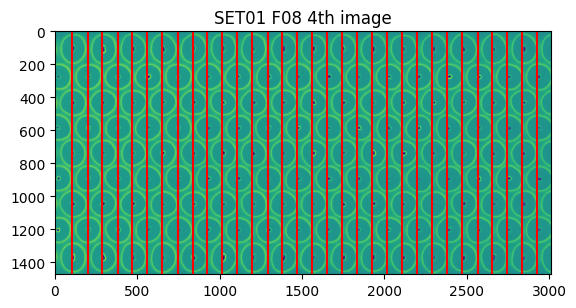

...

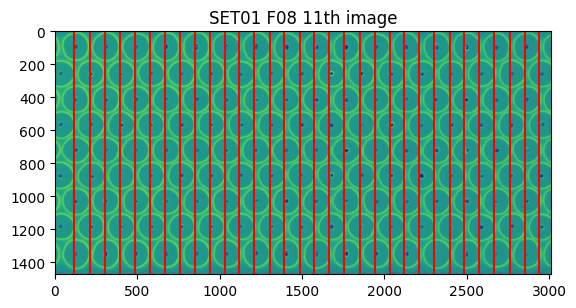

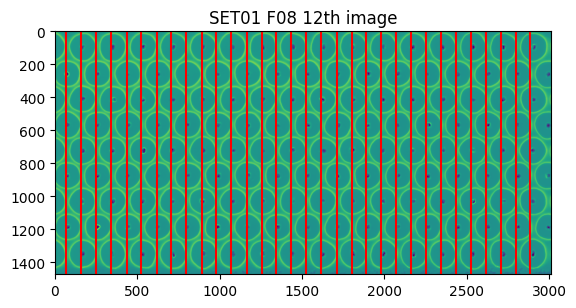

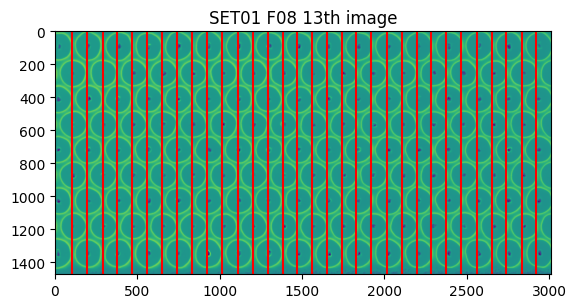

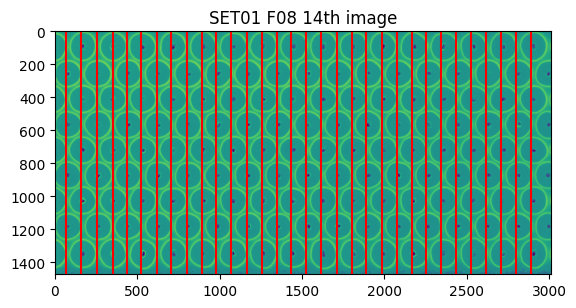

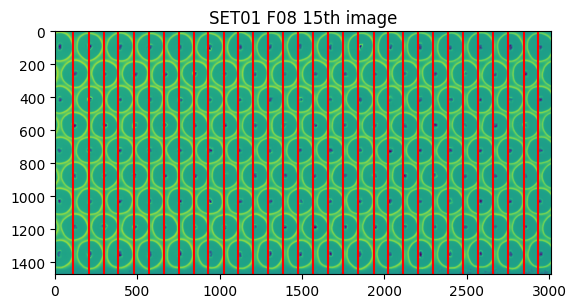

In [11]:

for index in range(16):
    F8_1 = img_dict['SET01']['F08'][index][0]
    F8_1_uint8 = (F8_1*255).astype('uint8')
    
    r = F8_1_uint8.copy()
    threshold = 9
    possible_section_col = []
    for r_val in range(70,len(r[0])-50,5) :
        x_val, y_val = [], []
        cnt = 0
        x_val, y_val = [], []
        for idx,val in enumerate(r[:,r_val]):
            if val < 80:
                # print(idx,end=",")
                x_val.append(idx)
                y_val.append(r_val)
                cnt+=1
        # print("")
        if cnt > threshold and (len(possible_section_col) ==0 or possible_section_col[-1] < r_val - 20):
            possible_section_col.append(r_val)
    # print(possible_section_col[:3])
    plt.title(f"SET01 F08 {index}th image")
    plt.imshow(r)
    # plt.axhline(r_val)
    for i in possible_section_col:
        plt.axvline(i,color='r')
    plt.pause(0.01)

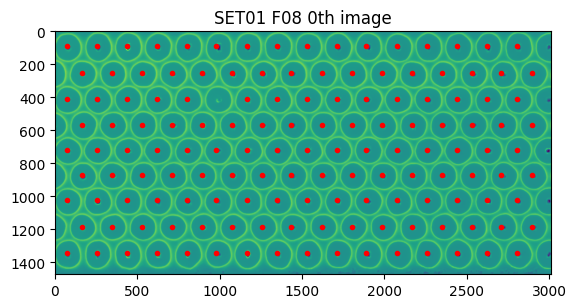

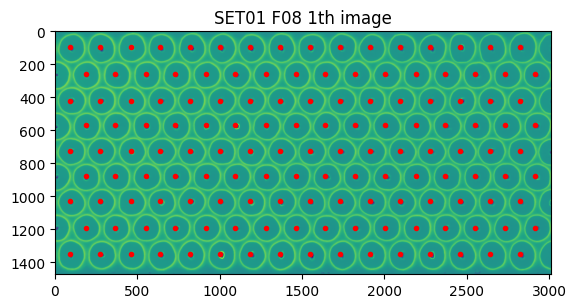

In [30]:
cal_std = False
for index in range(16):
    F8_1 = img_dict['SET01']['F08'][index][0]
    F8_1_uint8 = (F8_1*255).astype('uint8')
    
    r = F8_1_uint8.copy()
    threshold = 20
    possible_section_row = []
    for r_val in range(90,len(r)-50,5) :
        x_val, y_val = [], []
        cnt = 0
        x_val, y_val = [], []
        for idx,val in enumerate(r[r_val]):
            if val < 80:
                # print(idx,end=",")
                x_val.append(idx)
                y_val.append(r_val)
                cnt+=1
        # print("")
        if cnt > threshold and (len(possible_section_row) ==0 or possible_section_row[-1] < r_val - 140):
            possible_section_row.append(r_val)
    
    threshold = 9
    possible_section_col = []
    for r_val in range(70,len(r[0])-50,5) :
        x_val, y_val = [], []
        cnt = 0
        x_val, y_val = [], []
        for idx,val in enumerate(r[:,r_val]):
            if val < 80:
                # print(idx,end=",")
                x_val.append(idx)
                y_val.append(r_val)
                cnt+=1
        # print("")
        if cnt > threshold and (len(possible_section_col) ==0 or possible_section_col[-1] < r_val - 20):
            possible_section_col.append(r_val)
            
    possible_section = []
    pad = 15
    
    std = []
    all_section = []
    threshold = np.median(r) - 20
    for i in possible_section_row:
        for j in possible_section_col:
            std.append(np.std(r[i-pad:i+pad,j-pad:j+pad]))
            if cal_std is True:
                print(f"{j},{i} : {std[-1]}")
                all_section.append([i,j])
                if std[-1] > 20 and np.min(r[i-pad:i+pad,j-pad:j+pad]) < 100:
                    possible_section.append([i,j])
            else :
                if np.min(r[i-pad:i+pad,j-pad:j+pad]) < threshold:
                    possible_section.append([i,j])
    if cal_std is True:
        plt.title(f"SET01 F08 {index}th image")
        plt.imshow(r)
        for i,j in all_section:
            plt.scatter(j,i,color='r',marker='.')  
        plt.pause(0.01)
    plt.title(f"SET01 F08 {index}th image")
    plt.imshow(r)
    for i,j in possible_section:
        plt.scatter(j,i,color='r',marker='.')
    
    plt.pause(0.01)
    if index > 0 :
        break

140.0 150.1384124379612


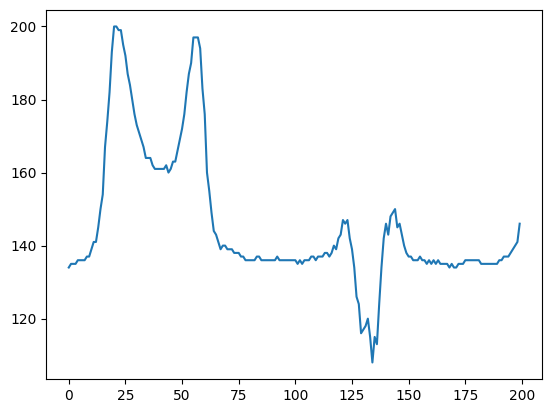

In [28]:

F8_1 = img_dict['SET01']['F08'][index][0]
F8_1_uint8 = (F8_1*255).astype('uint8')
plt.plot(F8_1_uint8[90][700:900])
print(np.median(F8_1_uint8),np.average(F8_1_uint8))

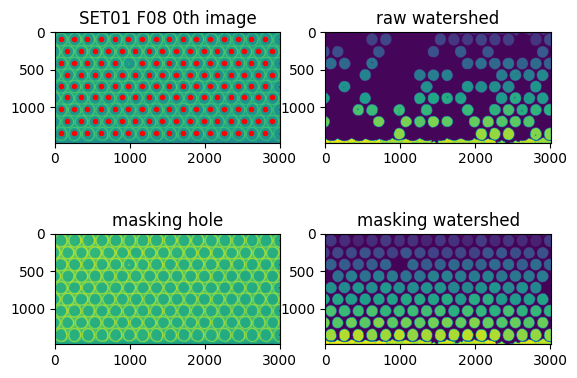

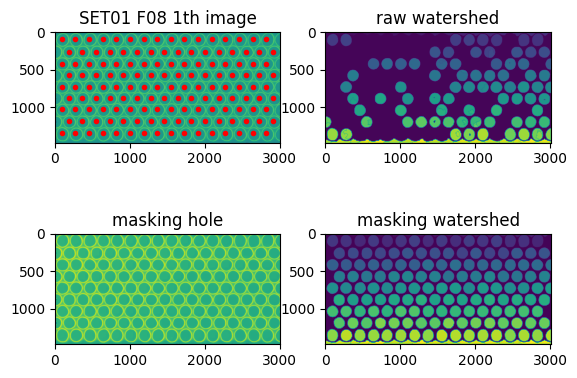

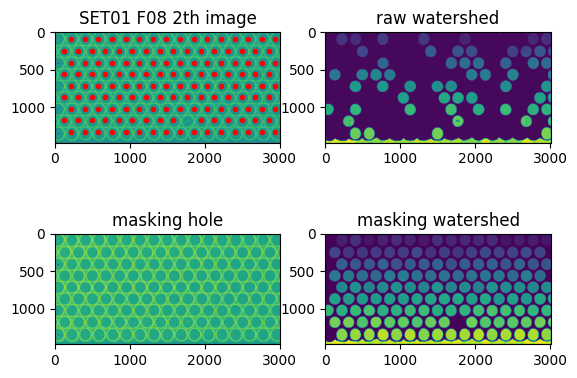

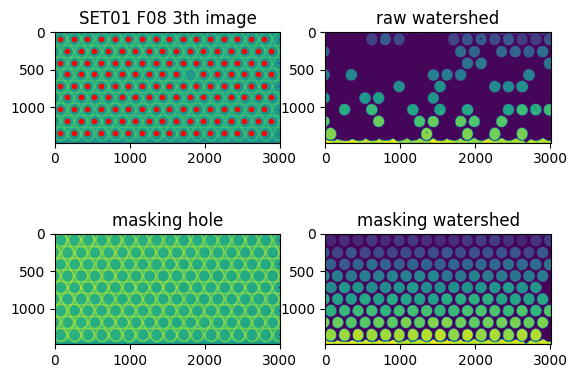

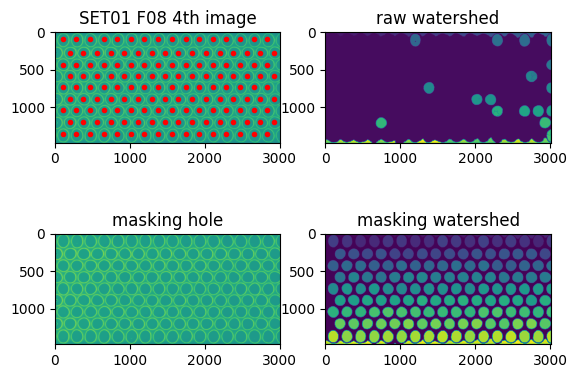

...

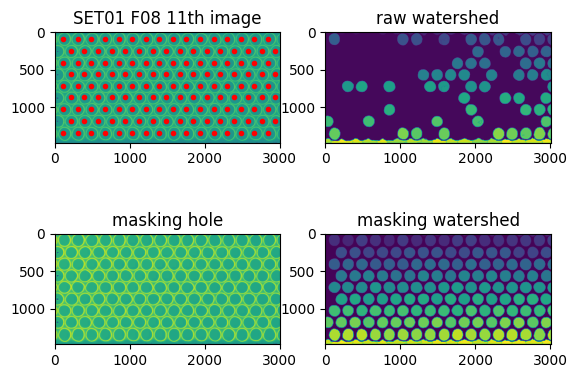

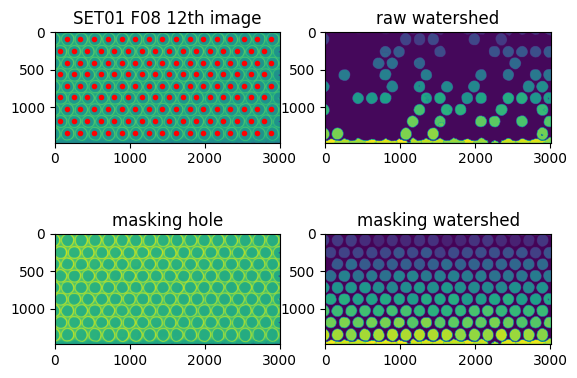

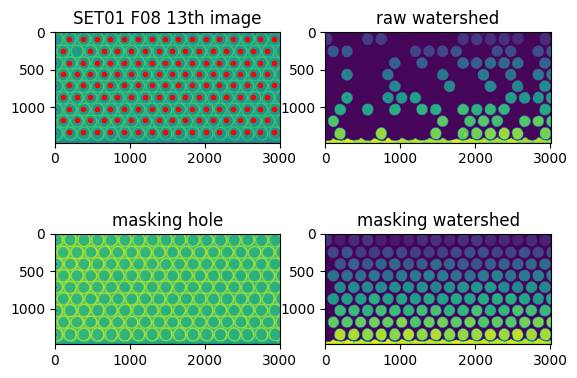

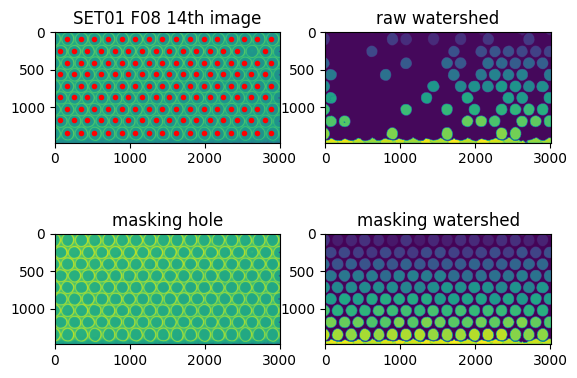

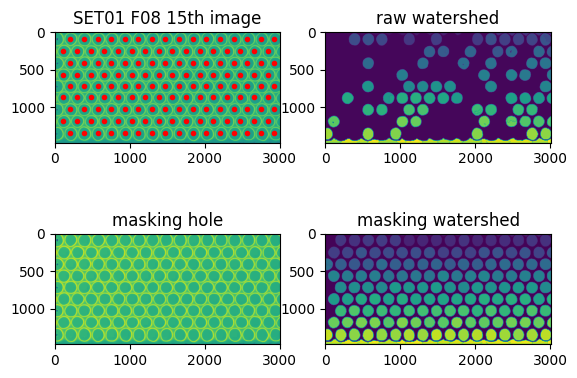

In [44]:

for index in range(16):
    F8_1 = img_dict['SET01']['F08'][index][0]
    F8_1_uint8 = (F8_1*255).astype('uint8')
    
    r = F8_1_uint8.copy()
    threshold = 20
    possible_section_row = []
    for r_val in range(90,len(r)-50,5) :
        x_val, y_val = [], []
        cnt = 0
        x_val, y_val = [], []
        for idx,val in enumerate(r[r_val]):
            if val < 80:
                # print(idx,end=",")
                x_val.append(idx)
                y_val.append(r_val)
                cnt+=1
        # print("")
        if cnt > threshold and (len(possible_section_row) ==0 or possible_section_row[-1] < r_val - 140):
            possible_section_row.append(r_val)
    
    threshold = 9
    possible_section_col = []
    for r_val in range(70,len(r[0])-50,5) :
        x_val, y_val = [], []
        cnt = 0
        x_val, y_val = [], []
        for idx,val in enumerate(r[:,r_val]):
            if val < 80:
                # print(idx,end=",")
                x_val.append(idx)
                y_val.append(r_val)
                cnt+=1
        # print("")
        if cnt > threshold and (len(possible_section_col) ==0 or possible_section_col[-1] < r_val - 15):
            possible_section_col.append(r_val)
            
    possible_section = []
    pad = 15
    
    threshold = np.median(r) - 20
    for i in possible_section_row:
        for j in possible_section_col:
            # if len(possible_section) != 0 :
            #     print(possible_section[-1], i,j)
            if np.min(r[i-pad:i+pad,j-pad:j+pad]) < threshold and (len(possible_section) == 0 or possible_section[-1][0] != i or (possible_section[-1][0] == i and possible_section[-1][1] < j - 100)):
                possible_section.append([i,j])
    # plot segmentation image
    plt.subplot(221)
    plt.title(f"SET01 F08 {index}th image")
    plt.imshow(r)
    for i,j in possible_section:
        plt.scatter(j,i,color='r',marker='.')
        
    w_r = watershed_original(r)
    plt.subplot(222)
    plt.title("raw watershed")
    plt.imshow(w_r)

    test = r.copy()
    pad = 40
    for i,j in possible_section:
        test[i-pad:i+pad,j-pad:j+pad] = np.median(test[i-pad:i+pad,j-pad:j+pad])
    
    plt.subplot(223)
    plt.title("masking hole")
    plt.imshow(test)
    
    w_test = watershed_original(test)
    plt.subplot(224)
    plt.title("masking watershed")
    plt.imshow(w_test)
    plt.pause(0.01)

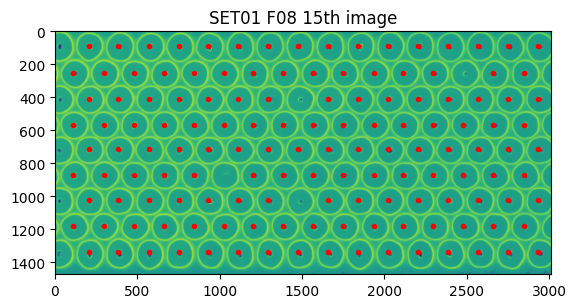

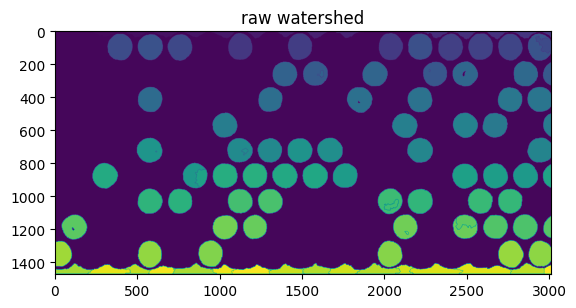

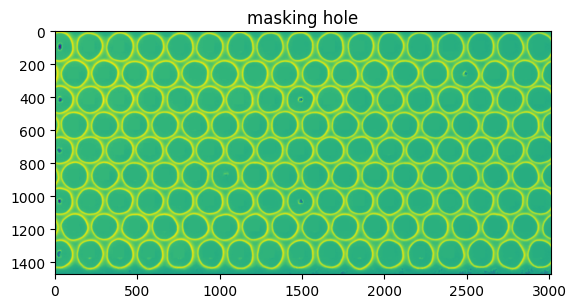

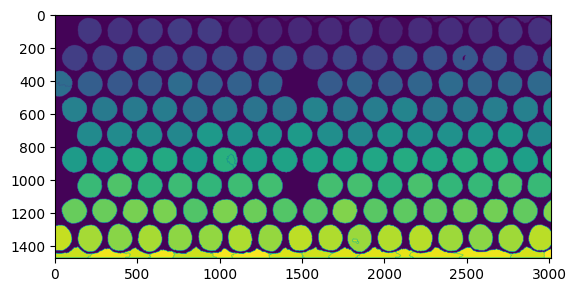

In [16]:

plt.title(f"SET01 F08 {index}th image")
plt.imshow(r)
for i,j in possible_section:
    plt.scatter(j,i,color='r',marker='.')
plt.pause(0.01)
w_r = watershed_original(r)
plt.title("raw watershed")
plt.imshow(w_r)
plt.pause(0.01)
test = r.copy()
pad = 35
for i,j in possible_section:
    test[i-pad:i+pad,j-pad:j+pad] = np.median(test[i-pad:i+pad,j-pad:j+pad])

plt.title("masking hole")
plt.imshow(test)
plt.pause(0.01)
w_test = watershed_original(test)
plt.imshow(w_test)

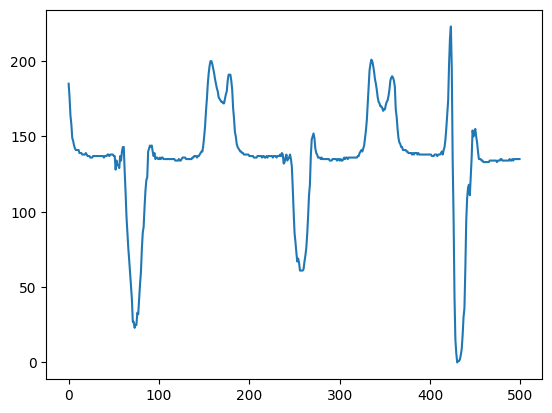

In [15]:
plt.plot(r[100,500:1000])

# make function

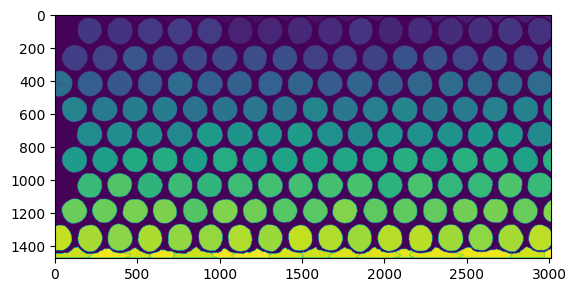

In [54]:

F8_1 = img_dict['SET01']['F08'][index][0]
F8_1_uint8 = (F8_1*255).astype('uint8')

a = segmentation_with_masking(F8_1_uint8)
plt.imshow(a)

In [51]:
a

In [53]:
def find_possible_section_1D(img, start,end,step,cnt_threshold,val_threshold, min_space,axis='row'):
    
    assert img.dtype == 'uint8'
    possible_section = []
    for r_val in range(start,end,step) :
        x_val, y_val = [], []
        cnt = 0
        
        search_space = None # img[r_val]
        if axis == 'row' :
            search_space = img[r_val]
        elif axis == 'col':
            search_space = img[:,r_val]
        else :
            raise ValueError(f"Unexpected axis value : {axis} choose between row and col")
        for idx,val in enumerate(search_space):
            if val < val_threshold:
                # print(idx,end=",")
                x_val.append(idx)
                y_val.append(r_val)
                cnt+=1
        # print("")
        if cnt > cnt_threshold and (len(possible_section) ==0 or possible_section[-1] < r_val - min_space):
            possible_section.append(r_val)
    return possible_section
def segmentation_with_masking(img, print_plt = False):
    assert img.dtype == 'uint8'
    
    possible_section_row = find_possible_section_1D(img,start=90, end=len(img)-50,step=5, 
                                                    cnt_threshold=20, val_threshold=80, 
                                                    min_space=140,axis='row')
    possible_section_col = find_possible_section_1D(img,start=70, end=len(img[0])-50,step=5, 
                                                    cnt_threshold=9, val_threshold=80, 
                                                    min_space=15,axis='row')
    
    possible_section = []
    pad = 15
    
    # find cross section which is near to hole
    threshold = np.median(r) - 20
    for i in possible_section_row:
        for j in possible_section_col:
            cond1 = np.min(r[i-pad:i+pad,j-pad:j+pad]) < threshold
            cond2_1 = (len(possible_section) == 0 or possible_section[-1][0] != i)
            cond2_2 = (possible_section[-1][0] == i and possible_section[-1][1] < j - 100)
            if cond1 and (cond2_1 or cond2_2):
                possible_section.append([i,j])

    masked_img = img.copy()
    pad = 40
    for i,j in possible_section:
        masked_img[i-pad:i+pad,j-pad:j+pad] = np.median(masked_img[i-pad:i+pad,j-pad:j+pad])
    masked_img_segmentation = watershed_original(masked_img)
    
    if print_plt is True:
        raw_segmentation = watershed_original(img)

        plt.subplot(221)
        plt.title(f"SET01 F08 {index}th image")
        plt.imshow(img)
        for i,j in possible_section:
            plt.scatter(j,i,color='r',marker='.')
        plt.subplot(222)
        plt.title("raw watershed")
        plt.imshow(raw_segmentation)
        plt.subplot(223)
        plt.title("masking hole")
        plt.imshow(test)
        plt.subplot(224)
        plt.title("masking watershed")
        plt.imshow(w_test)
        
    return masked_img_segmentation